### CNN Feature Based Image Copy Detection With Contextual Hash Embeddings
paper [here](https://www.mdpi.com/2227-7390/8/7/1172/pdf)

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import os
import cv2
import numpy as np
import sklearn
from sklearn import preprocessing

In [ ]:
#using Pretrained model
import torchvision
from torchvision import models
model = models.alexnet(pretrained = True)

In [ ]:
for child in model.children():
    print(child)
    break

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
)


In [ ]:
#taking only Conv LAyers
model1 = child[:12].cuda()
model1 = model1.eval()

In [ ]:
model1 #model Architecture

Sequential(
  (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
  (1): ReLU(inplace=True)
  (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (4): ReLU(inplace=True)
  (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (7): ReLU(inplace=True)
  (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
)

In [ ]:
#for generating Hash sequnces: By Rohan 
def get_hash_embedding(x):
    binary_coded = []
    adj = 8
    for row in range(0,x.shape[0]):
        for col in range(0,x.shape[1]):
            #key value
            x[row][col]
            #logics for the corners
            #corner 1
            if(row == 0 and col == 0):
                encode_num = []
                if(x[row][col] < x[row+1][col]):
                    encode_num.append(str(1))
                else:
                    encode_num.append(str(0))
                if(x[row][col] < x[row+1][col+1]):
                    encode_num.append(str(1))
                else:
                    encode_num.append(str(0))
                if(x[row][col] < x[row][col+1]):
                    encode_num.append(str(1))
                else:
                    encode_num.append(str(0))
                difference=adj-len(encode_num)
                for num in range(0,difference):
                    encode_num.append(str(0))
                binary_coded.append(''.join(encode_num))
    #             print("corner1")
    #             print(x[row][col])
            #cornor 2
            elif(row == 0 and col == x.shape[1]-1):
                encode_num = []
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                difference=adj-len(encode_num)
                for num in range(0,difference):
                    encode_num.append(str(0))
                binary_coded.append(''.join(encode_num))
    #             print("corner2")
    #             print(x[row][col])
            #cornor 3
            elif(row == x.shape[0]-1 and col == 0):
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                if(x[row][col] < x[row][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                binary_coded.append(''.join(encode_num))
    #             print("corner3")
    #             print(x[row][col])
            #cornor 4
            elif(row == x.shape[0]-1 and col == x.shape[1]-1):
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                difference=adj-len(encode_num)
                for num in range(0,difference):
                    encode_num.append(str(0))
                binary_coded.append(''.join(encode_num))
    #             print("corner4")
    #             print(x[row][col])
            #non cornor values.
            #logic for in between the elements.
            #condition 1
            elif(col == 0 and row !=0):
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                if(x[row][col] < x[row+1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                binary_coded.append(''.join(encode_num))
            #condition 2
            elif(row == 0 and col !=0):
                encode_num = []
                encode_num.append("0")
                encode_num.append("0")
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                encode_num.append("0")
                binary_coded.append(''.join(encode_num))
            #condition 3
            elif(row == x.shape[0]-1  and col != x.shape[1]-1):
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                if(x[row][col] < x[row][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                binary_coded.append(''.join(encode_num))
            #condition 4
            elif(row != x.shape[0]-1  and col == x.shape[1]-1):
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                encode_num.append("0")
                binary_coded.append(''.join(encode_num))
            #condition 5
            else:
                encode_num = []
                if(x[row][col] < x[row-1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col-1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row+1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                if(x[row][col] < x[row-1][col+1]):
                    encode_num.append("1")
                else:
                    encode_num.append("0")
                binary_coded.append(''.join(encode_num))
    return binary_coded

In [ ]:
#from itertools import chain


def hash_point(pt,arr,r,c):
   if r < 0 or c < 0 or r > 3 or c > 3:
       return 0
   else:
       npt = arr[r][c]
       return 1 if pt < npt else 0

def hash_gen(g,i,j):
   neighborhood = [(i-1,j),(i-1,j-1),(i,j-1),(i+1,j-1),(i+1,j),(i+1,j+1),(i,j+1),(i-1,j+1)]
   pt = g[i][j]
   for nbd in neighborhood:
       yield hash_point(pt,g,*nbd)
def che_gen(g):
   ls1=[]
   for i in range(4):
       #
       for j in range(4):
         ls2=''
         for cow in hash_gen(g,i,j):
           ls2=ls2+str(cow)
       ls1.append(ls2)
   return ls1
           #yield hash_gen(g,i,j)
     

# def eight_bit(ball):
#   st = []
#   s = ""
#   for i in range(0,len(ball)):
#     if((i+1)% 8 == 0):
#       st.append(s)
#       s = ""
#     s=str(ball[i])+s
#   return st

#a=eight_bit(list(chain(*che_gen(x))))
#a

In [ ]:
#Dividing Image into Slices
def get_blocks(cord,radius,path):
    max_loc = cord
    circle_radius = radius

    img = cv2.imread(path,0)
    
    image_array = img.copy()
    mask = np.zeros(image_array.shape, dtype=np.uint8)
    cv2.circle(mask, max_loc, circle_radius, (255, 255, 255), -1, 8, 0)

    result_array = image_array & mask

    # Crop/center result (assuming max_loc is of the form (x, y))
    result_array1 = result_array[max(0,max_loc[1] - circle_radius):max(0,max_loc[1] + circle_radius),
                             max(0,max_loc[0] - circle_radius):max(0,max_loc[0] + circle_radius)]

    #convert to log polar space
    log_polar = cv2.logPolar(result_array1,(radius,radius),circle_radius,1)

    
    #divide into bllocks
    log_polar_gray  = log_polar
   # M = int(log_polar_gray.shape[0]/4)
   # N = int(log_polar_gray.shape[1]/4)#

    #slices = []
   # for j in range(4):
   #     for i in range(4):
   #         if j!=3 and i!=3: #center
   #             slices.append(img[j*N:j*N+N,i*M:i*M+M])
   #         if j!=3 and i == 3: #top right corner
   #             slices.append(img[j*N:j*N+N,i*M:])
   #         if j == 3 and i!=3: #bottom down
   #
   #            slices.append(img[j*N:,i*M:i*M+M])
  #        if j==3 and i ==3: #bottom corner
   #             slices.append(img[j*N:,i*M:])
    #
    #return slices
    

    M = N = 4
    x_size = log_polar_gray.shape[1]
    y_size = log_polar_gray.shape[0]

    slices=[]
    for i in range(M):
      for j in range(N):
        roi = log_polar_gray[int(i*y_size/N):int(i*y_size/N) + int(y_size/N) ,int(j*x_size/M):int(j*x_size/M) + int(x_size/M)]
        slices.append(roi)

    return slices

In [ ]:
#for getting keypoints and radius
def get_coordinates_and_radius(keypoints_orb):
    keys = []
    for i in keypoints_orb:
        cord = [int(i) for i in i.pt]
        rad = int(i.size/2)
        keys.append([tuple(cord),rad])
    return keys

### CFM_LocalCNNFeatures_Hashembedding

In [ ]:
import numpy 

In [ ]:
files_path="/content/gdrive/My Drive/copy_detection/Pixy_project/original_image/"
val =sorted([int(i.split(".")[0]) for i in os.listdir(files_path)]) #os.listdir wont give you file order
images = [str(i)+".jpg" for i in val] #getting files in order

total_images_features = []
total_images_hash_values = []

for idx,i in enumerate(images):


    #reading image
    img = cv2.imread(files_path+i)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    
    #image to alexnet to get CFMs
    data_transform = transforms.ToTensor()
    img1 = data_transform(img)
    img2 = img1.unsqueeze(0)
    op = model1(img2.cuda())
    output = np.array(op.detach().cpu().numpy()[0]) #1,256,height,width
    
    #calculating image and cfm areas for ratio
    img_area = img.shape[0]*img.shape[1]
    cfm_area = output.shape[1]*output.shape[2] 
    area_ratio = cfm_area/img_area
    
    #passing image to ORB
    orb = cv2.ORB_create(nfeatures=1500)
    #keypoints_orb, descriptors = orb.detectAndCompute(img, None)
    keypoints_orb = orb.detect(img, None)

    keypoints = get_coordinates_and_radius(keypoints_orb)
    #print(keypoints)
    
    
    #Scaling CFM radius and coordinates
    cfm_radius = []
    cfm_coo = []
    for key in keypoints:
        cfm_radius.append(np.float32(area_ratio*key[1]))
        
        cfm_x = (output.shape[1]*key[0][0])/img.shape[0]
        cfm_y = (output.shape[2]*key[0][1])/img.shape[1]
        cfm_coo.append((np.float32(cfm_x),np.float32(cfm_y)))

    #Finding normalized radius from Minimum of 1 to B value
    val = [key[1] for key in keypoints]   
    #print(max(val))
    #print(min(val)) 
    x = np.array(cfm_radius)
    b = (max(val)-min(val))/(min(val))
    a = 1
    normalized_radius=(b-a)*((x-x.min())/(x.max()-x.min()))+a
    
    #For finding local CNN features(mapping keypoints to CFM)
    all_keypoint_features = []
    output = np.array(op.detach().cpu().numpy()[0])
    for cord,rad in zip(cfm_coo,normalized_radius):
        feature_map = []
        for fmap in range(len(output)):
            op = np.sum(output[fmap][int(cord[0]):int(cord[0])+int(rad),int(cord[1]):int(cord[1])+int(rad)])
            feature_map.append(op)
        op1 = np.array(feature_map).reshape(1,256)
        norm_final = sklearn.preprocessing.normalize(op1, norm='l2', axis=1, copy=True, return_norm=False)
        all_keypoint_features.append(norm_final)    
    
    #stacking all keypoints(ex:400) of a single image
    keypoint_feat = all_keypoint_features[0]
    for keypoint in all_keypoint_features[1:]:
        keypoint_feat = np.vstack((keypoint_feat,keypoint))
    
    print(keypoint_feat.shape)#(483,256)(500,256) 256 columns fixed
    total_images_features.append(keypoint_feat)
    
    #multiplying radius with Alpha 3.2
    expanded_radius = []
    for key,radius in keypoints:
        expand_r = int(int(radius/2)*3.2)
        expanded_radius.append(expand_r)
    
    cords = []
    for cord,radius in keypoints:
        cords.append(cord)
    
    #get Hash Values
    all_hash_values = []
    all_hash_values1=[]
    for cord,ex_radius in zip(cords,expanded_radius):
        slices = get_blocks(cord,radius,files_path+i)
        grey_intensities = np.array([np.mean(i) for i in slices]).reshape(4,4)
        #a=eight_bit(list(chain(*che_gen(x))))
        #a=list(che_gen(x))
        hash_val1 = che_gen(grey_intensities)
        hash_val = get_hash_embedding(grey_intensities)
        all_hash_values.append(hash_val)
        all_hash_values1.append(hash_val1)

    
    total_images_hash_values.append(all_hash_values)

    if idx==9 or idx==10 or idx==20 or idx==40 or idx==len(images):
    #  numpy.savez('gdrive/My Drive/copy_detection/' + str(idx) + 'test.npz', a=total_images_hash_values, b=total_images_features)
    #if idx==10:
    #  break

(1500, 256)


In [ ]:
#import numpy
#numpy.savez('gdrive/My Drive/copy_detection/original_image2.npz', a=total_images_hash_values, b=total_images_features)

In [ ]:
grey_intensities

array([[ 72.68449931,  71.3909465 ,  70.00823045,  71.78875171],
       [ 72.73525377,  71.99725652,  71.56104252,  70.42524005],
       [ 73.33470508,  73.68038409,  75.69272977, 108.88203018],
       [ 73.5569273 ,  75.34293553,  77.2345679 , 105.96296296]])

In [ ]:
all_hash_values[1]

['00000000',
 '00110000',
 '00110000',
 '10000000',
 '10001000',
 '11111100',
 '11111001',
 '11111000',
 '00001000',
 '01111000',
 '00111100',
 '01111000',
 '00000000',
 '01100000',
 '01100010',
 '00000000']

In [ ]:
all_hash_values1[1]

['00100000', '11111000', '01111000', '00000000']

In [ ]:
 # import numpy
# vet = numpy.load('gdrive/My Drive/copy_detection/scaled_vector_data.npz', allow_pickle= True)
# total_images_hash_values1 = vet['a']
# total_images_features1 = vet['b']

In [ ]:
#stacking all images all keypoints in to a single vector
img_feat = total_images_features[0]
for i in total_images_features[1:]:
    img_feat = np.vstack((img_feat,i))
    
print(img_feat.shape)

(42000, 256)


In [ ]:
total_images_features[0].shape #no of keypoints for first image, Keypoints may vary for image to image

(1500, 256)

In [ ]:
len(total_images_hash_values[1]) #same no of hash values as keypoints for all images

1500

In [ ]:
len(total_images_hash_values) # hash values of 38 images

28

### 3. Local_CNN_VBOW

In [ ]:
import scipy
import random

random.seed(101)

from scipy.cluster.vq import kmeans,vq #vq stands for vector quantization
k= 100 #maximum clusters can be 50
                                           

voc1,variance=kmeans(img_feat,k)        #voc decides no of clusters to be formed, based on distace
                                           # 50 is no of iterations

#clustering all the keypoints of all images
database_words = []
im_features=np.zeros((len(os.listdir(files_path)),k),"float32")
for i in range(len(os.listdir(files_path))):
    words1,distance=vq(total_images_features[i],voc1) #vector quantization
    database_words.append(words1)
    for w in words1:
        im_features[i][w]+=1

In [ ]:
im_features.shape #38images and their cluster frequency counts

(28, 100)

In [ ]:
im_features[0].shape #first image with its cluster frequencies

(100,)

In [ ]:
im_features[0] #no of occcurence of each cluster till 50 cluster with K array size

array([220.,   0.,   0., 170.,   1.,   0.,  11.,   0.,   0.,  32.,  12.,
         0.,   0.,  34.,   0.,  51.,   1.,  24.,   8.,   0.,   1.,   1.,
         5.,   1.,   0.,   1.,  33.,   0.,   0.,   0.,   0.,  45.,  13.,
        49.,   1.,   3.,   0.,   1.,  15.,  48.,  17.,   0.,   0.,  14.,
        50.,  45.,  28.,   0.,   0.,  39.,   0.,  10.,  18.,  16.,   0.,
         0.,   7.,   0.,   2.,   0.,  13.,   0.,   0.,  20.,   1.,   1.,
        29.,   3.,   0.,   0.,  31.,   9.,   0.,   0., 115.,   0.,   0.,
       251.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.], dtype=float32)

In [ ]:
database_words[0] #each and every keypoint grouped to one cluster.

array([ 0, 52, 43, ..., 71, 74, 33], dtype=int32)

### querry_image

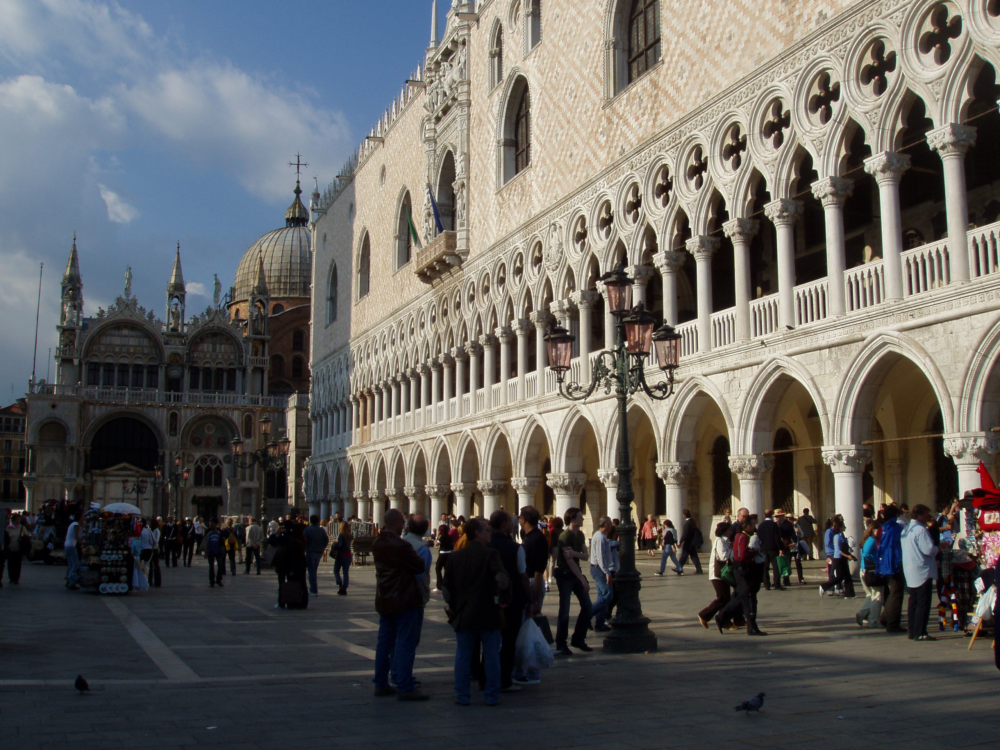

In [ ]:
import os
#lets take a sample image
path = "gdrive/My Drive/copy_detection/ours_croped_scaled/20.jpg"
from PIL import Image
Image.open(path)

In [ ]:
from torchvision import transforms
file = Image.open(path)

data_transform = transforms.ToTensor()
img1 = data_transform(file)
op = model1(img1.unsqueeze(0).cuda())

In [ ]:
output = np.array(op.detach().cpu().numpy()[0]) #1,256,height,width

In [ ]:
output.shape #cfms generated

(256, 119, 159)

In [ ]:
import cv2
img = cv2.imread(path)

In [ ]:
orb = cv2.ORB_create(nfeatures=1500)
keypoints_orb, descriptors = orb.detectAndCompute(img, None)

keypoints = get_coordinates_and_radius(keypoints_orb)

In [ ]:
img.shape

(1920, 2560, 3)

In [ ]:
#Scaling CFM radius and coordinates
cfm_radius = []
cfm_coo = []
for key in keypoints:
    cfm_radius.append(np.float32(area_ratio*key[1]))

    cfm_x = (output.shape[1]*key[0][0])/img.shape[0]
    cfm_y = (output.shape[2]*key[0][1])/img.shape[1]
    cfm_coo.append((np.float32(cfm_x),np.float32(cfm_y)))

#Finding normalized radius from Minimum of 1 to B value
val = [key[1] for key in keypoints]    
x = np.array(cfm_radius)
b = (max(val)-min(val))/(min(val))
#     print(b)
a = 1
normalized_radius=(b-a)*((x-x.min())/(x.max()-x.min()))+a

In [ ]:
all_keypoint_features = []
output = np.array(op.detach().cpu().numpy()[0])
for cord,rad in zip(cfm_coo,normalized_radius):
    feature_map = []
    for fmap in range(len(output)):
        op = np.sum(output[fmap][int(cord[0]):int(cord[0])+int(rad),int(cord[1]):int(cord[1])+int(rad)])
        feature_map.append(op)
    op1 = np.array(feature_map).reshape(1,256)
    norm_final = sklearn.preprocessing.normalize(op1, norm='l2', axis=1, copy=True, return_norm=False)
    all_keypoint_features.append(norm_final)    
#     print(all_keypoint_features[0].shape)#(1,256)


In [ ]:
keypoint_feat = all_keypoint_features[0]
for keypoint in all_keypoint_features[1:]:
    keypoint_feat = np.vstack((keypoint_feat,keypoint))

In [ ]:
keypoint_feat.shape #324 keypoints only for a test image

(1500, 256)

### we got 256 local CNN features for al the 430 Keypoints. Now Generating CHE for all 430 keypoints

In [ ]:
img2 = cv2.drawKeypoints(img, keypoints_orb, None)

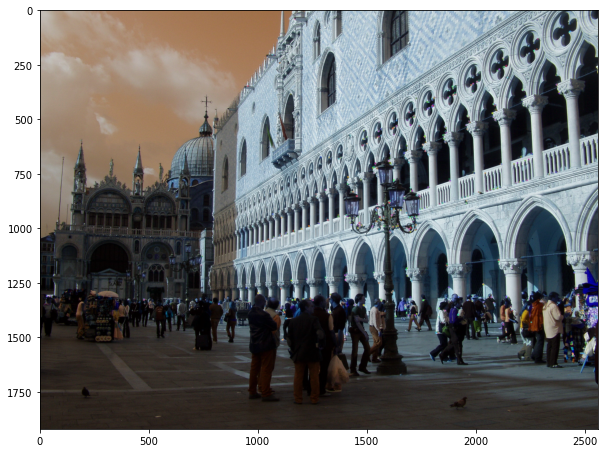

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (10,12))
plt.imshow(img2)
plt.show()

In [ ]:
expanded_radius = []
for key,radius in keypoints:
    expand_r = int(int(radius/2)*3.2)
    expanded_radius.append(expand_r)

In [ ]:
cords = []
for cord,radius in keypoints:
    cords.append(cord)

In [ ]:
path = "gdrive/My Drive/copy_detection/ours_croped_scaled/20.jpg"

all_hash_values = []
for cord,ex_radius in zip(cords,expanded_radius):
    slices = get_blocks(cord,radius,path)
#     print(len(slices))
    if len(slices) == 25 or len(slices) == 20:
        grey_intensities = np.round(np.array([np.mean(i) for i in slices]).reshape(5,int(len(slices)/5)),2)    
    else:
        grey_intensities = np.round(np.array([np.mean(i) for i in slices]).reshape(4,int(np.ceil(16/5))),2)
    hash_val = get_hash_embedding(grey_intensities)
    all_hash_values.append(hash_val)

In [ ]:
len(all_hash_values) #324 hash points for our querry image

1500

In [ ]:
# import scipy
# import random
# random.seed(101)

# from scipy.cluster.vq import kmeans,vq #vq stands for vector quantization
# k= 100
# voc,variance=kmeans(keypoint_feat,k,50) #all keypoint features of all images

q_features=np.zeros((1,k),"float32")    
words,distance=vq(keypoint_feat,voc1) #all keypoint features of single image
for w in words:
    q_features[0][w]+=1

In [ ]:
import sys
import numpy 
numpy.set_printoptions(threshold=sys.maxsize)

In [ ]:
q_features #It returns a vector of length n_clusters with its frequency count

array([[483.,  93.,   0.,   0.,   0.,  58.,  13.,   2.,   3.,   2.,   6.,
         14.,   8.,  16.,   6.,  86.,  12.,   0.,   0.,   7.,   0.,   5.,
         23.,   0.,   0.,  64.,   0.,   6.,   8.,  45.,   7.,   0.,   0.,
          4.,  35.,  12.,  14.,  16.,   0.,   0.,  13.,  24.,   0.,  78.,
          2.,  10.,  11.,   0.,   0.,   0.,  10.,  35.,   9.,   0.,  33.,
          0.,   0.,   9.,   0.,   0.,   0.,  75.,   8.,  37.,   0.,  19.,
          0.,  65.,  13.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.]], dtype=float32)

### Final: data base image information

In [ ]:
img_feat.shape

(42000, 256)

In [ ]:
total_images_features[0].shape #local CNN features

(1500, 256)

In [ ]:
len(total_images_hash_values)

28

In [ ]:
len(total_images_hash_values[0]) #hash embeddings

1500

In [ ]:
im_features.shape #VBOW

(28, 100)

In [ ]:
voc1.shape #47 clusters

(79, 256)

### Final: Querry image information

In [ ]:
keypoint_feat.shape #Local CNN Features

(1500, 256)

In [ ]:
len(all_hash_values) #hash embeddings

1500

In [ ]:
q_features

array([[483.,  93.,   0.,   0.,   0.,  58.,  13.,   2.,   3.,   2.,   6.,
         14.,   8.,  16.,   6.,  86.,  12.,   0.,   0.,   7.,   0.,   5.,
         23.,   0.,   0.,  64.,   0.,   6.,   8.,  45.,   7.,   0.,   0.,
          4.,  35.,  12.,  14.,  16.,   0.,   0.,  13.,  24.,   0.,  78.,
          2.,  10.,  11.,   0.,   0.,   0.,  10.,  35.,   9.,   0.,  33.,
          0.,   0.,   9.,   0.,   0.,   0.,  75.,   8.,  37.,   0.,  19.,
          0.,  65.,  13.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.]], dtype=float32)

In [ ]:
sum(q_features[0]) 

1500.0

In [ ]:
voc.shape #shows clusters for our querry image

NameError: ignored

### Inverted index Creation 

In [ ]:
# #generating filepath:im_features in dictionary

# files_path="gdrive/My Drive/copy_detection/lamp_images/"

# val =sorted([int(i.split(".")[0]) for i in os.listdir(files_path)]) #os.listdir wont give you file order
# images = [str(i)+".jpg" for i in val] #getting files in order

image_vocab = {} #filepath,vocab
for file_name,im_feature in zip(images,im_features):
    image_vocab[file_name] = list(im_feature)

In [ ]:
from collections import defaultdict
inv_indx = defaultdict(list) #defaultdict(list, {})
for imgidx,vocab in image_vocab.items():
    for idx,count in enumerate(vocab):
        if int(count) > 0:
            inv_indx[idx].append(imgidx)

In [ ]:
from collections import defaultdict
inverted_indx = defaultdict(list) 
for image_id,feature,kp in zip(list(range(len(images))),im_features,database_words): #101.jpg, im_feature,430kp
    for indx,count in enumerate(feature): #for every feature in im_features
        if int(count)>0: #if fequency value is >0
            # no = int(image_id.split(".")[0]) # image no
            hashes = [{ind:total_images_hash_values[image_id][ind]}  for ind,j in enumerate(kp) if j == indx]
            inverted_indx[indx].append([image_id,hashes])

In [ ]:
len(inv_indx),len(inverted_indx) #cross check1

(79, 79)

In [ ]:
for i,val in enumerate(database_words[0]):#cross check2
    if val == 0:
        print(i)

0
12
17
27
31
57
60
62
72
92
99
106
123
124
137
142
148
175
181
206
215
218
219
223
224
227
233
235
242
246
266
269
270
274
278
281
285
292
293
300
303
310
313
328
330
332
335
342
344
346
358
364
369
374
375
377
398
401
404
407
409
419
423
475
481
484
495
504
506
509
516
528
531
534
537
554
558
565
566
571
572
573
578
581
582
585
587
594
603
611
626
633
635
647
654
660
664
668
671
672
678
679
684
686
700
704
712
725
735
747
755
772
774
779
789
791
792
794
796
801
802
806
811
818
819
822
828
851
860
878
896
911
916
917
921
933
935
944
947
948
954
962
963
964
965
970
971
973
989
995
999
1001
1004
1011
1013
1017
1037
1049
1054
1061
1065
1071
1084
1091
1110
1114
1116
1117
1120
1122
1125
1143
1144
1146
1150
1151
1152
1154
1163
1168
1170
1178
1183
1184
1190
1195
1198
1200
1206
1212
1221
1223
1225
1235
1236
1237
1240
1293
1297
1299
1311
1316
1332
1338
1341
1342
1350
1366
1397
1399
1401
1407
1424
1434
1435
1445
1463
1476
1490
1495


#### inverted_index for querry image

In [ ]:
#for querry image
#generating filepath:im_features in dictionary

q_image = ['20.jpg']
q_image_vocab = {} #filepath,vocab
for file_name,q_feature in zip(q_image,q_features):
    q_image_vocab[file_name] = list(q_feature)


In [ ]:
from collections import defaultdict

q_inv_indx = defaultdict(list) #defaultdict(list, {})

for imgidx,vocab in q_image_vocab.items():
    for idx,count in enumerate(vocab):
        if int(count) > 0:
            q_inv_indx[idx].append(imgidx)

In [ ]:
q_inv_indx

defaultdict(list,
            {0: ['20.jpg'],
             1: ['20.jpg'],
             5: ['20.jpg'],
             6: ['20.jpg'],
             7: ['20.jpg'],
             8: ['20.jpg'],
             9: ['20.jpg'],
             10: ['20.jpg'],
             11: ['20.jpg'],
             12: ['20.jpg'],
             13: ['20.jpg'],
             14: ['20.jpg'],
             15: ['20.jpg'],
             16: ['20.jpg'],
             19: ['20.jpg'],
             21: ['20.jpg'],
             22: ['20.jpg'],
             25: ['20.jpg'],
             27: ['20.jpg'],
             28: ['20.jpg'],
             29: ['20.jpg'],
             30: ['20.jpg'],
             33: ['20.jpg'],
             34: ['20.jpg'],
             35: ['20.jpg'],
             36: ['20.jpg'],
             37: ['20.jpg'],
             40: ['20.jpg'],
             41: ['20.jpg'],
             43: ['20.jpg'],
             44: ['20.jpg'],
             45: ['20.jpg'],
             46: ['20.jpg'],
             50: ['20.jpg'],
   

In [ ]:
len(all_hash_values),len(words),q_features

(1500,
 1500,
 array([[483.,  93.,   0.,   0.,   0.,  58.,  13.,   2.,   3.,   2.,   6.,
          14.,   8.,  16.,   6.,  86.,  12.,   0.,   0.,   7.,   0.,   5.,
          23.,   0.,   0.,  64.,   0.,   6.,   8.,  45.,   7.,   0.,   0.,
           4.,  35.,  12.,  14.,  16.,   0.,   0.,  13.,  24.,   0.,  78.,
           2.,  10.,  11.,   0.,   0.,   0.,  10.,  35.,   9.,   0.,  33.,
           0.,   0.,   9.,   0.,   0.,   0.,  75.,   8.,  37.,   0.,  19.,
           0.,  65.,  13.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.]], dtype=float32))

In [ ]:
from collections import defaultdict
q_inverted_indx = defaultdict(list) 


for indx,count in enumerate(q_features[0]): #for every feature in im_features
    if int(count)>0: #if fequency value is >0
        no = int(q_image[0].split(".")[0]) # image no
        hashes = [{ind:all_hash_values[ind]}  for ind,j in enumerate(words) if j == indx]
        q_inverted_indx[indx].append([q_image[0],hashes])

In [ ]:
database_words[0]

array([ 0, 52, 43, 43, 40,  3, 45, 31, 70, 15, 38, 33,  0, 45, 33, 60, 44,
        0, 77, 70, 70, 15,  3, 77, 49, 74, 74,  0, 40, 44, 45,  0, 77,  3,
        3, 77, 77, 77, 70, 74, 74, 33, 51, 77, 44,  3, 33, 17, 77, 77,  3,
       26, 13, 66, 77, 77, 77,  0, 77, 77,  0, 77,  0, 15, 60, 26, 49, 49,
       49, 77,  3,  6,  0, 15, 39, 63, 74, 74, 77, 13, 49,  3, 31, 18, 22,
       77,  3, 77, 39,  3, 77, 77,  0, 77, 74, 77, 32, 52, 39,  0, 26, 44,
       49, 31, 44,  6,  0, 13, 44, 77, 77, 77, 35, 77, 77, 77, 77,  9, 45,
       49, 35, 39, 74,  0,  0, 38, 15, 21, 77, 45, 46, 17, 66, 77, 60, 77,
       46,  0, 77, 15, 77, 31,  0,  9, 26, 77, 66, 43,  0, 15,  3,  3, 49,
       77,  3,  3,  9, 32, 45,  3, 74, 77, 26, 77, 60, 37, 33, 74, 31, 49,
       33, 74, 74, 13, 44,  0, 77, 13, 77, 70, 38,  0, 66, 71,  3, 32, 44,
        3,  3, 26,  3,  3, 77, 77, 13, 40, 53,  3, 31, 40, 13, 15,  3,  3,
       45, 58,  0, 77, 70, 43, 49, 26, 74, 15, 74,  0, 77, 63,  0,  0, 20,
       13, 77,  0,  0, 77

In [ ]:
import collections
from nltk import flatten
import sys
import math
all_kp =[]
for i in range(0,len(database_words)):
    all_kp.append(list(database_words[i]))
cat= flatten(all_kp) # all images keypoints to a single list :16664 keypoints
ctr = collections.Counter(cat)
final_dict=(dict(ctr))
final_dict = dict(collections.OrderedDict(sorted(final_dict.items())))
N= 45#len(final_dict)
IDF_database = []
for (term,term_frequency) in final_dict.items():
  term_IDF = math.log(float(N) / term_frequency)
  IDF_database.append([np.round(term_IDF,2), term])
IDF_database

{0: 15022, 1: 402, 2: 124, 3: 373, 4: 932, 5: 394, 6: 171, 7: 304, 8: 279, 9: 450, 10: 477, 11: 212, 12: 407, 13: 213, 14: 514, 15: 639, 16: 320, 17: 305, 18: 46, 19: 366, 20: 526, 21: 257, 22: 551, 23: 1003, 24: 129, 25: 234, 26: 256, 27: 324, 28: 288, 29: 274, 30: 307, 31: 231, 32: 93, 33: 221, 34: 385, 35: 146, 36: 270, 37: 315, 38: 279, 39: 264, 40: 213, 41: 119, 42: 465, 43: 428, 44: 394, 45: 331, 46: 1041, 47: 262, 48: 275, 49: 266, 50: 323, 51: 345, 52: 80, 53: 254, 54: 214, 55: 148, 56: 68, 57: 200, 58: 262, 59: 747, 60: 146, 61: 405, 62: 642, 63: 270, 64: 239, 65: 360, 66: 970, 67: 546, 68: 66, 69: 175, 70: 445, 71: 293, 72: 438, 73: 246, 74: 573, 75: 162, 76: 205, 77: 538, 78: 543}


[[-5.81, 0],
 [-2.19, 1],
 [-1.01, 2],
 [-2.11, 3],
 [-3.03, 4],
 [-2.17, 5],
 [-1.34, 6],
 [-1.91, 7],
 [-1.82, 8],
 [-2.3, 9],
 [-2.36, 10],
 [-1.55, 11],
 [-2.2, 12],
 [-1.55, 13],
 [-2.44, 14],
 [-2.65, 15],
 [-1.96, 16],
 [-1.91, 17],
 [-0.02, 18],
 [-2.1, 19],
 [-2.46, 20],
 [-1.74, 21],
 [-2.51, 22],
 [-3.1, 23],
 [-1.05, 24],
 [-1.65, 25],
 [-1.74, 26],
 [-1.97, 27],
 [-1.86, 28],
 [-1.81, 29],
 [-1.92, 30],
 [-1.64, 31],
 [-0.73, 32],
 [-1.59, 33],
 [-2.15, 34],
 [-1.18, 35],
 [-1.79, 36],
 [-1.95, 37],
 [-1.82, 38],
 [-1.77, 39],
 [-1.55, 40],
 [-0.97, 41],
 [-2.34, 42],
 [-2.25, 43],
 [-2.17, 44],
 [-2.0, 45],
 [-3.14, 46],
 [-1.76, 47],
 [-1.81, 48],
 [-1.78, 49],
 [-1.97, 50],
 [-2.04, 51],
 [-0.58, 52],
 [-1.73, 53],
 [-1.56, 54],
 [-1.19, 55],
 [-0.41, 56],
 [-1.49, 57],
 [-1.76, 58],
 [-2.81, 59],
 [-1.18, 60],
 [-2.2, 61],
 [-2.66, 62],
 [-1.79, 63],
 [-1.67, 64],
 [-2.08, 65],
 [-3.07, 66],
 [-2.5, 67],
 [-0.38, 68],
 [-1.36, 69],
 [-2.29, 70],
 [-1.87, 71],
 [-2.28, 

In [ ]:
N

45

In [ ]:
inverted_indx.keys()

dict_keys([0, 3, 4, 6, 9, 10, 13, 15, 16, 17, 18, 20, 21, 22, 23, 25, 26, 31, 32, 33, 34, 35, 37, 38, 39, 40, 43, 44, 45, 46, 49, 51, 52, 53, 56, 58, 60, 63, 64, 65, 66, 67, 70, 71, 74, 77, 8, 11, 36, 59, 62, 72, 12, 28, 29, 69, 1, 5, 7, 24, 30, 50, 55, 57, 75, 78, 14, 27, 47, 61, 42, 48, 76, 68, 73, 2, 19, 41, 54])

In [ ]:
inverted_indx[1][0][0] #cluster1, first images out of 6 images,imagename
inverted_indx[1][0][1] #cluster1, first images out of 6 images, kp and hash
inverted_indx[1][0][1][0].values() #first hash values

dict_values([['00000000', '00111100', '00111110', '00000000', '10001110', '01000000', '00110111', '10000000', '00001111', '10011100', '11111111', '10000000', '00000010', '00000000', '00100011', '10000000']])

In [ ]:
from typing import List
def distance_hash_sequence(q_hash_sequence:List[str],d_hash_sequence:List[str])->float:
    M = 4
    N = 4
    distance = 0
    #calculating the distance
    for index in range(0,len(q_hash_sequence)):
        for q_hash_sequence_bit,d_hash_sequence_bit in zip(list(q_hash_sequence[index]),list(d_hash_sequence[index])):
            distance+=abs(int(q_hash_sequence_bit)-int(d_hash_sequence_bit))/(M*N*8)
    return distance

In [ ]:
dist_t = 0.35

final_res = {}
for i in q_inverted_indx.keys():                     #querry clusters
    for j in inverted_indx.keys():                   #database clusters
        if i==j:
            images = len(inverted_indx[i])#6 images to compare
            img_count = {}  
            for image in range(images):             #in each image
                mini = min(len(inverted_indx[i][image][1]),len(q_inverted_indx[i][0][1])) #which one has less len
                for hs in range(mini):
                    a = list(q_inverted_indx[i][0][1][hs].values())[0]
                    b = list(inverted_indx[i][image][1][hs].values())[0]
                    dist = distance_hash_sequence(a,b)
                    if dist < dist_t:
                        if inverted_indx[i][image][0] not in img_count:
                            img_count[inverted_indx[i][image][0]]=0
                        if inverted_indx[i][image][0] in img_count:
                            img_count[inverted_indx[i][image][0]]+=1
    final_res[i]=img_count

In [ ]:
final_res

{0: {0: 9,
  2: 237,
  3: 235,
  4: 2,
  5: 335,
  6: 10,
  7: 3,
  8: 483,
  9: 483,
  10: 483,
  11: 483,
  12: 439,
  13: 483,
  14: 391,
  15: 423,
  16: 480,
  17: 483,
  18: 483,
  19: 483,
  20: 328,
  21: 379,
  22: 325,
  23: 329,
  24: 399,
  25: 359,
  26: 396,
  27: 391},
 1: {5: 7,
  8: 11,
  9: 6,
  10: 13,
  11: 14,
  12: 1,
  13: 2,
  16: 93,
  17: 1,
  18: 83,
  19: 87,
  20: 16,
  21: 17,
  22: 9,
  23: 11,
  24: 6,
  27: 2},
 5: {5: 36,
  8: 1,
  9: 3,
  11: 4,
  12: 16,
  13: 41,
  14: 16,
  15: 58,
  16: 27,
  18: 58,
  19: 58,
  20: 5,
  21: 1,
  23: 1},
 6: {2: 13,
  3: 13,
  5: 5,
  8: 9,
  9: 7,
  11: 4,
  15: 1,
  16: 13,
  17: 13,
  18: 13,
  19: 11,
  20: 10,
  24: 2,
  25: 1,
  26: 3,
  27: 1},
 7: {5: 2,
  8: 2,
  9: 2,
  10: 2,
  11: 2,
  15: 1,
  16: 2,
  17: 2,
  19: 2,
  21: 2,
  22: 2,
  23: 2,
  24: 2,
  25: 2,
  26: 2,
  27: 2},
 8: {3: 3,
  5: 3,
  9: 3,
  10: 3,
  11: 3,
  12: 3,
  13: 3,
  14: 3,
  15: 3,
  17: 3,
  18: 3,
  19: 3,
  23: 2,
  25:

In [ ]:
q_inverted_indx.keys()

dict_keys([0, 1, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 19, 21, 22, 25, 27, 28, 29, 30, 33, 34, 35, 36, 37, 40, 41, 43, 44, 45, 46, 50, 51, 52, 54, 57, 61, 62, 63, 65, 67, 68, 73])

In [ ]:
IDF_database[5]

[-2.17, 5]

In [ ]:
for vbw  in q_inverted_indx.keys():
    for val,key in final_res[vbw].items():
        print(vbw,":",val,key*IDF_database[vbw][0])

0 : 0 -52.29
0 : 2 -1376.9699999999998
0 : 3 -1365.35
0 : 4 -11.62
0 : 5 -1946.35
0 : 6 -58.099999999999994
0 : 7 -17.43
0 : 8 -2806.23
0 : 9 -2806.23
0 : 10 -2806.23
0 : 11 -2806.23
0 : 12 -2550.5899999999997
0 : 13 -2806.23
0 : 14 -2271.71
0 : 15 -2457.6299999999997
0 : 16 -2788.7999999999997
0 : 17 -2806.23
0 : 18 -2806.23
0 : 19 -2806.23
0 : 20 -1905.6799999999998
0 : 21 -2201.99
0 : 22 -1888.2499999999998
0 : 23 -1911.4899999999998
0 : 24 -2318.19
0 : 25 -2085.79
0 : 26 -2300.7599999999998
0 : 27 -2271.71
1 : 5 -15.33
1 : 8 -24.09
1 : 9 -13.14
1 : 10 -28.47
1 : 11 -30.66
1 : 12 -2.19
1 : 13 -4.38
1 : 16 -203.67
1 : 17 -2.19
1 : 18 -181.76999999999998
1 : 19 -190.53
1 : 20 -35.04
1 : 21 -37.23
1 : 22 -19.71
1 : 23 -24.09
1 : 24 -13.14
1 : 27 -4.38
5 : 5 -78.12
5 : 8 -2.17
5 : 9 -6.51
5 : 11 -8.68
5 : 12 -34.72
5 : 13 -88.97
5 : 14 -34.72
5 : 15 -125.86
5 : 16 -58.589999999999996
5 : 18 -125.86
5 : 19 -125.86
5 : 20 -10.85
5 : 21 -2.17
5 : 23 -2.17
6 : 2 -17.42
6 : 3 -17.42
6 : 5 -6

In [ ]:
file = {}
for vbw  in q_inverted_indx.keys():
    for val,key in final_res[vbw].items():
#         print(val,key*IDF_database[vbw][0])
        if val not in file:
            file[val] = key*IDF_database[vbw][0]
        if val in file:
            file[val]+= key*IDF_database[vbw][0]
        

In [ ]:
sorted(file.items(), key=lambda item: item[1])

[(19, -7608.7599999999975),
 (18, -7293.529999999997),
 (16, -7288.759999999999),
 (17, -6466.179999999998),
 (13, -6208.24),
 (9, -5947.609999999999),
 (8, -5898.530000000001),
 (10, -5879.44),
 (11, -5862.4299999999985),
 (12, -5644.439999999998),
 (15, -5521.319999999997),
 (24, -5121.72),
 (14, -5066.56),
 (26, -5044.840000000001),
 (27, -4864.83),
 (21, -4851.340000000001),
 (25, -4531.28),
 (20, -4352.679999999999),
 (5, -4331.699999999998),
 (23, -4241.41),
 (22, -4110.21),
 (3, -3135.29),
 (2, -3108.08),
 (6, -116.19999999999999),
 (0, -104.58),
 (7, -37.03),
 (4, -23.24)]

### Image, weight